In [1]:
import gradio as gr
import numpy as np
import IPython
from IPython.display import Audio, display
import torch
import librosa, librosa.display
from tqdm import tqdm

# import sys  
# sys.path.insert(0, '../')
from audioldm2 import text_to_audio, build_model, seed_everything
from audioldm2.latent_diffusion.modules.diffusionmodules.util import (
    make_ddim_sampling_parameters,
    make_ddim_timesteps,
    noise_like,
    extract_into_tensor,
)
from audioldm2.latent_diffusion.models.ddim import DDIMSampler

%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

In [3]:
%reload_ext autoreload

In [4]:
%matplotlib inline

In [5]:
import warnings

def fxn():
    warnings.warn("deprecated", DeprecationWarning)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()


In [6]:
audioldm = None
current_model_name = None

model_name = 'audioldm_16k_crossattn_t5' # doesnt work very well? But the only thing that fits on my machine
# model_name = 'audioldm2-full' # Needs more memory than what I have
# model_name = 'audioldm_48k'

latent_diffusion=build_model(model_name=model_name)

Loading AudioLDM-2: audioldm_16k_crossattn_t5
Loading model on cuda:0
{'variables': {'sampling_rate': 16000, 'mel_bins': 64, 'latent_embed_dim': 8, 'latent_t_size': 256, 'latent_f_size': 16, 'in_channels': 8, 'optimize_ddpm_parameter': True, 'warmup_steps': 5000}, 'step': {'validation_every_n_epochs': 1, 'save_checkpoint_every_n_steps': 5000, 'max_steps': 1500000, 'save_top_k': 2}, 'preprocessing': {'audio': {'sampling_rate': 16000, 'max_wav_value': 32768, 'duration': 10.24}, 'stft': {'filter_length': 1024, 'hop_length': 160, 'win_length': 1024}, 'mel': {'n_mel_channels': 64, 'mel_fmin': 0, 'mel_fmax': 8000}}, 'augmentation': {'mixup': 0}, 'model': {'target': 'audioldm2.latent_diffusion.models.ddpm.LatentDiffusion', 'params': {'first_stage_config': {'base_learning_rate': 8e-06, 'target': 'audioldm2.latent_encoder.autoencoder.AutoencoderKL', 'params': {'sampling_rate': 16000, 'batchsize': 4, 'monitor': 'val/rec_loss', 'image_key': 'fbank', 'subband': 1, 'embed_dim': 8, 'time_shuffle': 1

/home/purnima/anaconda3/envs/audioldm2/lib/python3.8/site-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/home/purnima/anaconda3/envs/audioldm2/lib/python3.8/site-packages/torchaudio/transforms/_transforms.py:580: UserWarning: Argument 'onesided' has been deprecated and has no influence on the behavior of this module.
  warnings.warn(


DiffusionWrapper has 265.53 M params.


/home/purnima/anaconda3/envs/audioldm2/lib/python3.8/site-packages/torch/nn/utils/weight_norm.py:28: UserWarning: torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.
  warnings.warn("torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.")


In [7]:
def noise_to_mel_to_wave(predicted_noise):
    mel = latent_diffusion.decode_first_stage(predicted_noise)
    waveform = latent_diffusion.mel_spectrogram_to_waveform(
        mel, savepath="", bs=None, name="somename", save=False
    )
    return waveform

In [8]:
plt.close()

In [9]:
latent_t_per_second=25.6
sample_rate=16000
duration = 10.0 #Duration is minimum 10 secs. The generated sounds are weird for <10secs
guidance_scale = 3
random_seed = 45
n_candidates = 1
batch_size = 1
ddim_steps = 200

fbank = torch.zeros((batch_size, 1024, 64))
stft = torch.zeros((batch_size, 1024, 512))
waveform = torch.zeros((batch_size, 160000))

seed_everything(int(random_seed))
x_T = torch.randn((1, 8, 256, 16), device="cuda")

latent_diffusion.latent_t_size = int(duration * latent_t_per_second)

In [10]:
def sample_diffusion(batch):
    with torch.no_grad():

        shape = (latent_diffusion.channels, latent_diffusion.latent_t_size, latent_diffusion.latent_f_size)
        device=latent_diffusion.device
        eta=1.0
        temperature = 1.0
        
        cond_dict = {}
        for cond_model_key in latent_diffusion.cond_stage_model_metadata.keys():
            cond_stage_key = latent_diffusion.cond_stage_model_metadata[cond_model_key]["cond_stage_key"]
            xc = batch["text"]
            cond_dict[cond_model_key] = latent_diffusion.get_learned_conditioning(xc, key=cond_model_key, unconditional_cfg=False)
    
        uncond_dict = {}
        model_idx = 0 #default to the first in the cond list.
        for key in latent_diffusion.cond_stage_model_metadata:
            uncond_dict[key] = latent_diffusion.cond_stage_models[model_idx].get_unconditional_condition(batch_size)
        
        ddim_sampler = DDIMSampler(latent_diffusion, device=device)
        ddim_sampler.make_schedule(ddim_num_steps=ddim_steps, ddim_eta=eta, verbose=False)
        
       
        x_init = x_T
        timesteps = ddim_sampler.ddim_timesteps
    
        intermediates = {"pred_x0": [x_init], "predicted_noise": [x_init]}
        time_range = np.flip(timesteps)
        total_steps = timesteps.shape[0]
        print(f"Running DDIM Sampling with {total_steps} timesteps")
        iterator = tqdm(time_range, desc="DDIM Sampler", total=total_steps)
    
        for i, step in enumerate(iterator):
            index = total_steps - i - 1
            t_in = torch.full((batch_size,), step, device=device, dtype=torch.long)
    
            #from p_sample_ddim
            model_uncond = ddim_sampler.model.apply_model(x_init, t_in, uncond_dict) #Unconditioned epsilon estimate
            model_cond = ddim_sampler.model.apply_model(x_init, t_in, cond_dict) #Conditioned epsilon estimate

            # CFG; model_output is the estimated error after CFG
            e_t = model_uncond + guidance_scale * (model_cond - model_uncond)

        
            alphas = ddim_sampler.ddim_alphas
            alphas_prev = ddim_sampler.ddim_alphas_prev
    
            sqrt_one_minus_alphas = ddim_sampler.ddim_sqrt_one_minus_alphas
            sigmas = ddim_sampler.ddim_sigmas
            
            # select parameters corresponding to the currently considered timestep
            a_t = torch.full((batch_size, 1, 1, 1), alphas[index], device=device)
            a_prev = torch.full((batch_size, 1, 1, 1), alphas_prev[index], device=device)
            sigma_t = torch.full((batch_size, 1, 1, 1), sigmas[index], device=device)
            sqrt_one_minus_at = torch.full((batch_size, 1, 1, 1), sqrt_one_minus_alphas[index], device=device)
    
            
            pred_x0 = (x_init - sqrt_one_minus_at * e_t) / a_t.sqrt()
            dir_xt = (1.0 - a_prev - sigma_t**2).sqrt() * e_t
            noise = sigma_t * noise_like(x_init.shape, device, repeat=False) * temperature
            x_prev = a_prev.sqrt() * pred_x0 + dir_xt + noise
    
            x_init = x_prev
            #return x_prev, pred_x0, e_t, model_uncond => img, pred_x0, predicted_noise, predicted_uncond_noise
    
            log_every_t = 100
            if index % log_every_t == 0 or index == total_steps - 1:
                intermediates["pred_x0"].append(pred_x0)
                intermediates["predicted_noise"].append(e_t)
    
    
        mel = latent_diffusion.decode_first_stage(x_prev)
        waveform = latent_diffusion.mel_spectrogram_to_waveform(
            mel, savepath="", bs=None, name="", save=False
        )
        return mel, waveform, model_cond, model_uncond, e_t 
        #=> mel of estimated z; wav of estimated z; predicted noise (epsilon); predicted noise unconditional; predicted noise with CFG


def plot(waveform, predicted_noise, predicted_uncond_noise):
    epsilon_noise = noise_to_mel_to_wave(predicted_noise)
    epsilon_noise_uncond = noise_to_mel_to_wave(predicted_uncond_noise)
    
    IPython.display.display(IPython.display.Audio(waveform[0][0], rate=16000))
    IPython.display.display(IPython.display.Audio(epsilon_noise[0][0], rate=16000))
    IPython.display.display(IPython.display.Audio(epsilon_noise_uncond[0][0], rate=16000))
    
    %matplotlib inline
    
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(15,5))
    
    D = librosa.amplitude_to_db(np.abs(librosa.stft(waveform[0][0], hop_length=512)),ref=np.max)
    librosa.display.specshow(D, y_axis='linear', sr=16000, hop_length=512, x_axis='time', ax=axs[0])
    # axs[0].set_title(text) 
    
    D = librosa.amplitude_to_db(np.abs(librosa.stft(epsilon_noise[0][0], hop_length=512)),ref=np.max)
    librosa.display.specshow(D, y_axis='linear', sr=16000, hop_length=512, x_axis='time', ax=axs[1])
    axs[1].set_title("epsilon noise predicted")
    
    D = librosa.amplitude_to_db(np.abs(librosa.stft(epsilon_noise_uncond[0][0], hop_length=512)),ref=np.max)
    librosa.display.specshow(D, y_axis='linear', sr=16000, hop_length=512, x_axis='time', ax=axs[2])
    axs[2].set_title("Unconditioned classifier free guidance noise")
    
    torch.norm(predicted_noise), torch.norm(predicted_uncond_noise)

Running DDIM Sampling with 200 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:23<00:00,  8.58it/s]


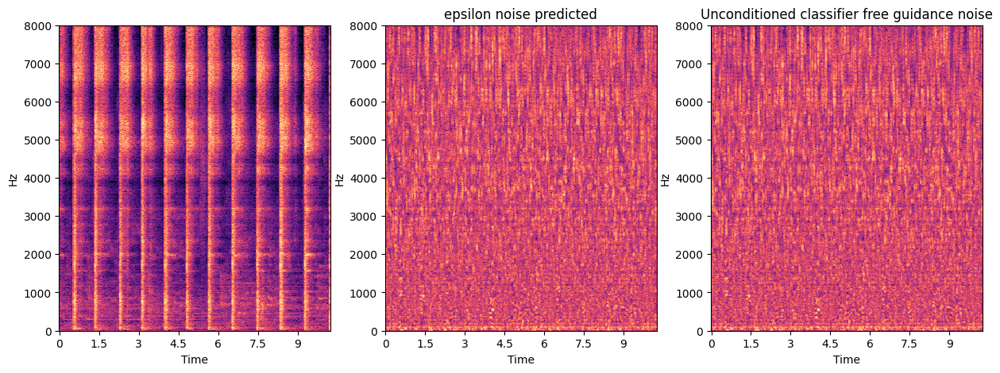

In [13]:
text = "A drumstick is continuously hitting a hard metal surface in a large room."
# text = "A honeybee singing"
text = [text] * batch_size
batch = {
        "text": text,  # list
        "fname": ['some-name']  # list
}

predicted_mel, predicted_wav, predicted_noise, predicted_uncond_noise, predicted_noise_with_cfg = sample_diffusion(batch)
plot(predicted_wav, predicted_noise, predicted_uncond_noise) 

In [96]:
torch.norm(predicted_uncond_noise), torch.norm(predicted_uncond_noise_brightness), torch.norm(predicted_uncond_noise_dullness)

(tensor(135.3272, device='cuda:0'),
 tensor(50.4995, device='cuda:0'),
 tensor(51.8926, device='cuda:0'))

Running DDIM Sampling with 200 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:23<00:00,  8.56it/s]


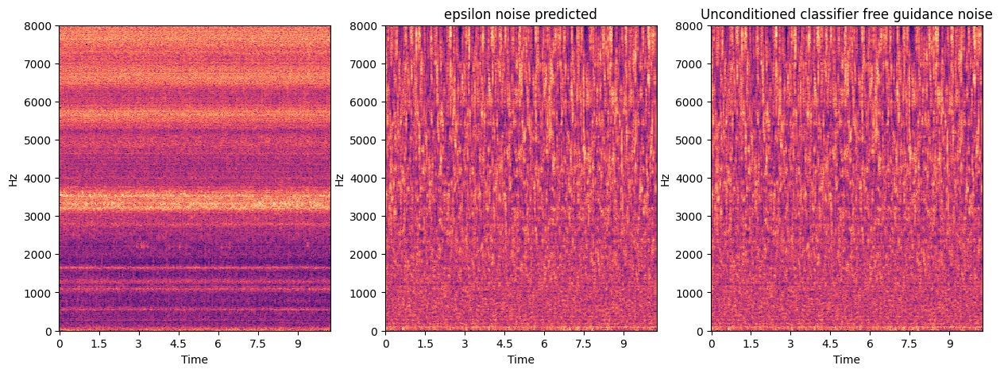

In [70]:
text_bright_concept = "An extremely bright sound with many high frequency components"
text_bright_concept = [text_bright_concept] * batch_size
batch_brightness = {
        "text": text_bright_concept,  # list
        "fname": ['some-name-brightness']  # list
}

predicted_mel_brightness, predicted_wav_brightness, predicted_noise_brightness, \
predicted_uncond_noise_brightness, predicted_noise_with_cfg_brightness = sample_diffusion(batch_brightness)
plot(predicted_wav_brightness, predicted_noise_brightness, predicted_uncond_noise_brightness)     

Running DDIM Sampling with 200 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:23<00:00,  8.61it/s]


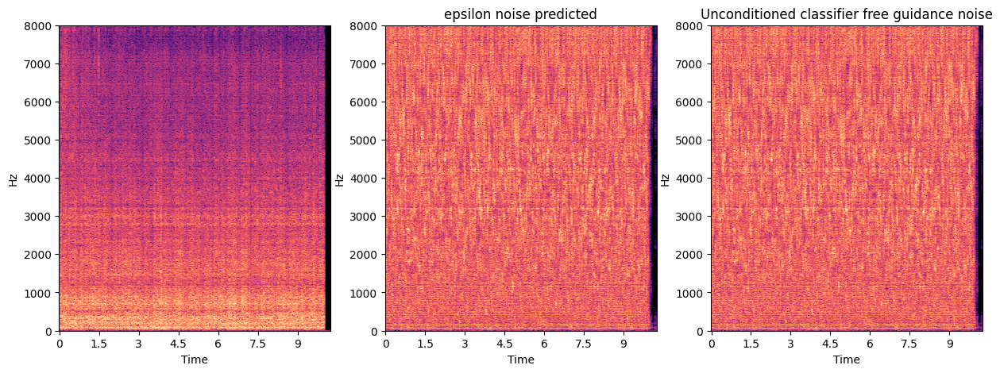

In [71]:
text_dull_concept = "An extremely dull or muffled sound with many low frequency components"
text_dull_concept = [text_dull_concept] * batch_size
batch_dullness = {
        "text": text_dull_concept,  # list
        "fname": ['some-name-dullness']  # list
}

predicted_mel_dullness, predicted_wav_dullness, predicted_noise_dullness, \
predicted_uncond_noise_dullness, predicted_noise_with_cfg_dullness = sample_diffusion(batch_dullness)
plot(predicted_wav_dullness, predicted_noise_dullness, predicted_uncond_noise_dullness)     

In [31]:
torch.norm(predicted_uncond_noise_dullness), torch.norm(predicted_uncond_noise_brightness), torch.norm(predicted_uncond_noise)

(tensor(51.9843, device='cuda:0'),
 tensor(56.2088, device='cuda:0'),
 tensor(77.5185, device='cuda:0'))

Running DDIM Sampling with 200 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:23<00:00,  8.66it/s]


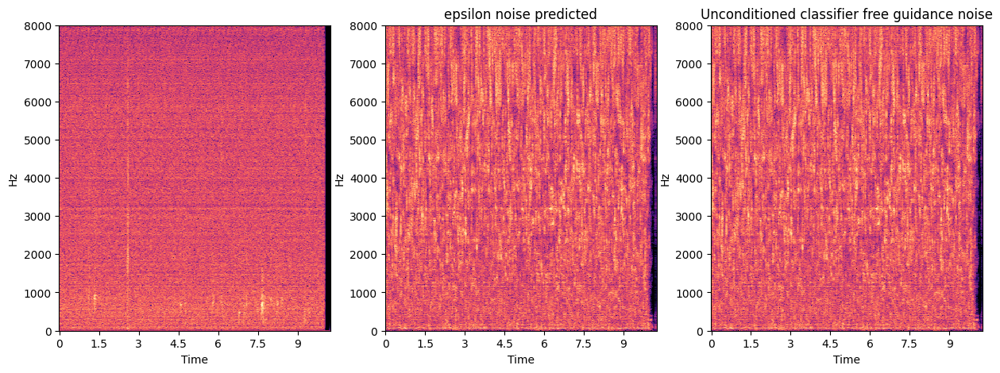

In [13]:
text_bright_concept = "Silent"
text_bright_concept = [text_bright_concept] * batch_size
batch_brightness = {
        "text": text_bright_concept,  # list
        "fname": ['some-name-brightness']  # list
}

predicted_mel_brightness, predicted_wav_brightness, predicted_noise_brightness, \
predicted_uncond_noise_brightness, predicted_noise_with_cfg_brightness = sample_diffusion(batch_brightness)
plot(predicted_wav_brightness, predicted_noise_brightness, predicted_uncond_noise_brightness)     